In [1]:
# Librerías

import numpy as np
from matplotlib import pyplot as plt
from IPython.display import Audio
from scipy.io.wavfile import read
import matplotlib.patches as patches

In [2]:
'''
Extracción de Segmentos:

Función que segmenta la señal ventanas de tamaño fijo con cierto solapamiento
entre ellas.

Un tamaño más pequeño de paso (step) implica un mayor solapamiento entre ventanas.
'''

def extraer_ventanas(signal, size, fs):

  # Tamaño de paso
  step = int(0.010 * fs) # 10% de fs
  n_seg = int((len(signal) - size) / step) # Número de segmentos

  # Extraer segmentos
  windows = [signal[i * step : i * step + size]
  for i in range(n_seg)]

  # Stack (cada fila es una ventana)
  return np.vstack(windows)


# 1. Transformada de Fourier de Tiempo Corto - Espectrogramas

## 1.2 Carga y Visualización de la Señal

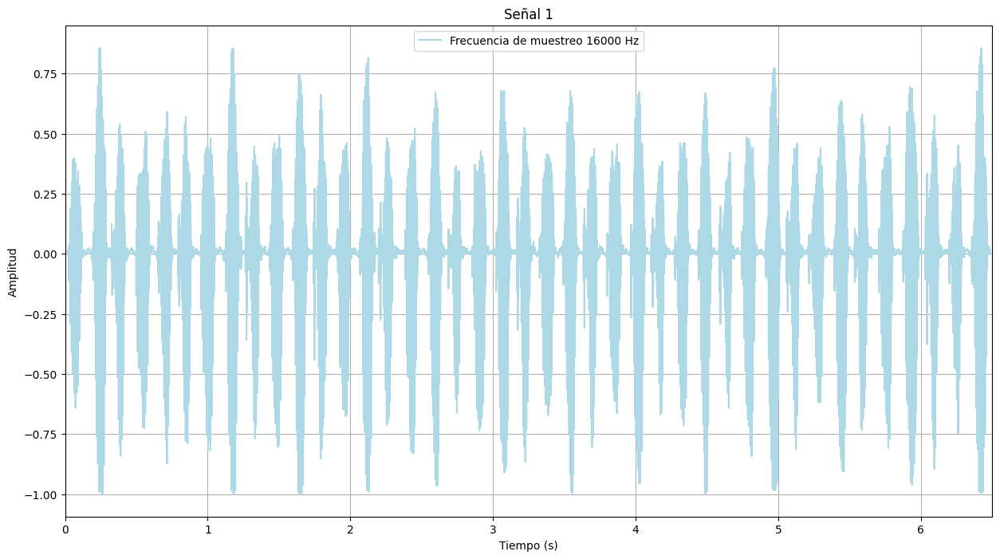

In [3]:
'''
1. Cargue, normalice, grafique y escuche las señales compartidas (senal1.wav y senal2.wav).
'''

# Señal 1
sig1 = ("/content/senal1.wav")
fs,x = read(sig1)
sig1 = x/float(max(abs(x))) # Normalización de la señal
t =  np.arange(0,float(len(x))/fs,1.0/fs) # Vector de tiempo

# Gráfica
plt.figure(figsize =(15,8))
plt.plot(t,sig1, '#ADD8E6')
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title('Señal 1')
plt.xlim(0, 6.5)
plt.legend([f'Frecuencia de muestreo {fs} Hz'])
plt.grid()
plt.show()

# Escuchar el audio
Audio(sig1,rate =fs)

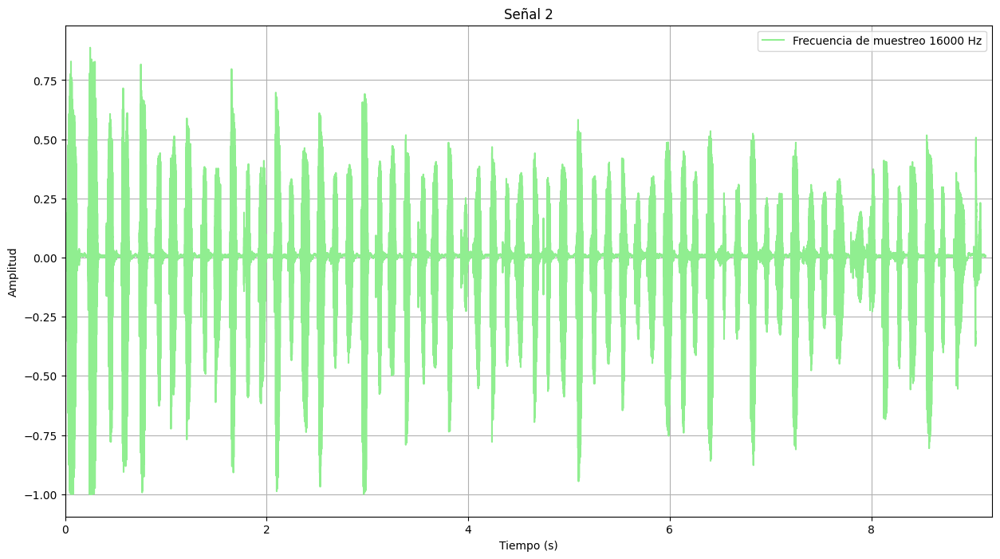

In [4]:
# Señal 2
sig2 = ("/content/senal2.wav")
fs,x = read(sig2)
sig2 = x/float(max(abs(x))) # Normalización de la señal
t =  np.arange(0,float(len(x))/fs,1.0/fs) # Vector de tiempo

# Gráfica
plt.figure(figsize =(15,8))
plt.plot(t,sig2, '#90EE90')
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title('Señal 2')
plt.xlim(0, 9.2)
plt.legend([f'Frecuencia de muestreo {fs} Hz'])
plt.grid()
plt.show()

# Escuchar el audio
Audio(sig2,rate =fs)

## 1.3 Extracción de Segmentos

In [5]:
'''
También llamado enventanado y es el proceso mediante el cual se segmenta una señal en N ventanas para luego aplicarle la STFT.
Use la función mostrada a continuación y segmente su señal con un tamaño de ventana de 40 ms.
Para este punto elija solo una de las dos señales.
'''

# Se toma la señal 2

vent = extraer_ventanas(sig2, int(0.04 * fs), fs)
vent.shape # (filas, columnas)

(909, 640)

## 1.4 Aplicación de Ventanas

1. Consulte cómo se construye y se aplica una ventana Hamming a una señal.
¿Qué tamaño de ventana debe usar?

Con la expresión $w(n) = 0.54 - 0.46cos\frac{2\pi n}{L}$ para $ 0 \leq n \leq L -1 $ y cero en otros casos, siendo $w(n)$ el valor de la ventana en el índice $n$ y N el valor de la ventana.

Se usa para evitar discontinuidades introducidas al analizar solo una fracción de la señal o al introducir muestras con valor cero que se traduzcan en componentes de alta frecuencia en el espectro.

Se multiplica cada punto de la señal por el correspondiente punto de la ventana de Hamming.

Para el tamaño de la ventana se debe tener en cuenta que:
- A mayor N, menor el tamaño de la ventana en el dominio del tiempo pero se compensa con un mejor espectro de frecuencia.
- A menor N, el espectro de frecuencias tendrá Aliasing.

In [6]:
'''
2. Aplique la ventana construida para cada uno de los segmentos extraídos anteriormente

Se aplica la ventana de Hamming a cada una de las ventanas extraídas para reducir
fugas espectrales y poder tener una mejor resolución en frecuencia de la trasnformada
'''

ham = np.hamming(int(0.04 * fs)) # Construyo la ventana con un tamaño de 40ms x fs

apply =  np.array([ventana* ham for ventana in vent])

apply.shape

(909, 640)

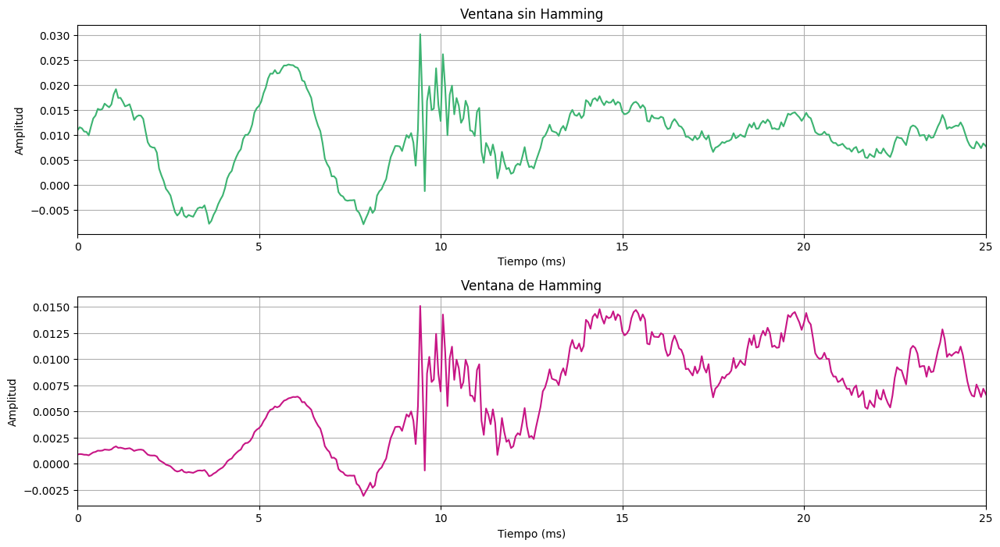

In [7]:
'''
3. Usando un subplot, grafique un segmento antes y después de aplicarle la ventana Hanning.
¿Observa alguna diferencia? Explique.
'''

t =  np.arange(0, 40 , 40/(0.04 * fs)) # Vector de tiempo

# Gráfica
plt.figure(figsize =(15,8))

plt.subplot(2, 1, 1)
plt.plot(t, vent[50], '#3CB371')
plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title('Ventana sin Hamming')
plt.xlim(0, 25)
plt.grid()

plt.subplots_adjust(hspace = 0.3)

plt.subplot(2, 1, 2)
plt.plot(t , apply[50], '#C71585')
plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title('Ventana de Hamming')
plt.xlim(0, 25)
plt.grid()

plt.show()

Se observan atenuaciones en los picos de la señal, esta característica se observa sobretodo en los extremos de la señal, donde las atenuaciones a los cambios abruptos son menores o casi nulas.

El 'centro' de la señal se conserva tal como la original.

## 1.5 Aplicación de la STFT

In [8]:
'''
1. Usando la siguiente función calcule la STFT a cada uno de los segmentos del ítem anterior, para esto use un
tamaño de NFFT de 512.

Esta función calcula la densidad espectral de potencia de la señal a través de la FFT.
'''

def potspec(X, size, n_padded_min = 0):

  # Zero padding
  # Se aumenta el tamaño de la señal de entrada para aumentar su longitud hasta
  # una potencia de 2 para tener eficiencia computacional.

  if n_padded_min == 0:
    n_padded = max(n_padded_min, int(2 ** np.ceil(np.log(size) / np.log(2))))
  else:
    n_padded = n_padded_min

  # Transformada de Fourier
  Y = np.fft.fft(X, n = n_padded)
  Y = np.absolute(Y)
  # non-redundant part
  m = int(n_padded / 2) + 1
  Y = Y[:, :m]
  Img=Y.imag
  Real=Y.real
  spec= np.sqrt(Real**2+ Img**2)
  return spec, n_padded

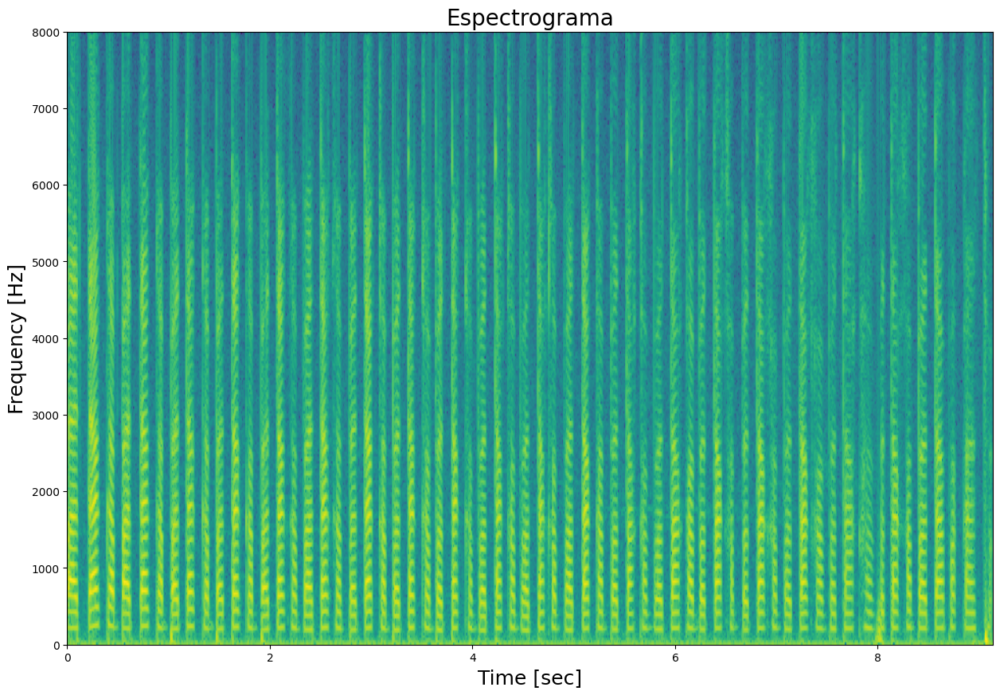

In [9]:

potspec(apply, 640, 512); # matriz de ventanas, tamaño de las ventanas, tamaño de la FFT


'''
2. Grafique la representación tiempo-frecuencia obtenida en el ítem anterior.
'''
espectro, nfft = potspec(apply, 640, 512) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(15, 10))
plt.title('Espectrograma', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

3. ¿Qué puede concluir del espectrograma? ¿En qué intervalos de frecuencia está definida la señal? Explique.

En el espectrograma, los tonos azules o más oscuros representan bajos niveles de energía asociados a bajas frecuencias en la señal.
Para los tonos amarillos y verdes, más claros, se tiene una acumulación de energía que corresponde a frecuencias mayores que en la señal representan la voz.

Para la frecuencia presentada debe tenerse en cuenta dos factores:

1. Las frecuencias permitidas para la voz (masculina: (50 Hz, 200 Hz), femenina: (150 Hz, 350 Hz)), por lo que la mayor concentración de energía se dará en rangos bajos de frecuencia, tal como se muestra en el espectrograma.

2. El teorema de nyquist, pues con una frecuencia de muestreo de 16 kHz, la frecuencia máxima sería menor o igual a 8 kHz.

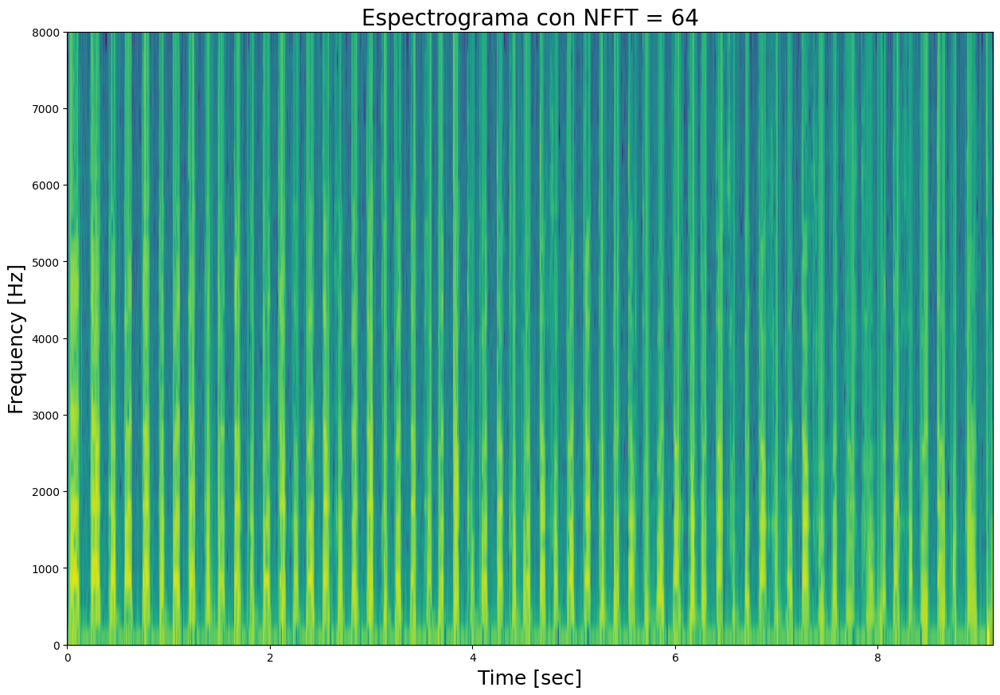

In [10]:
'''
4. Calcule y grafique la STFT para valores de NFFT equivalentes a 64, 1024 y 4096.
'''

# NFFT = 64

espectro, nfft = potspec(apply, 640, 64) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(15, 10))
plt.title('Espectrograma con NFFT = 64', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

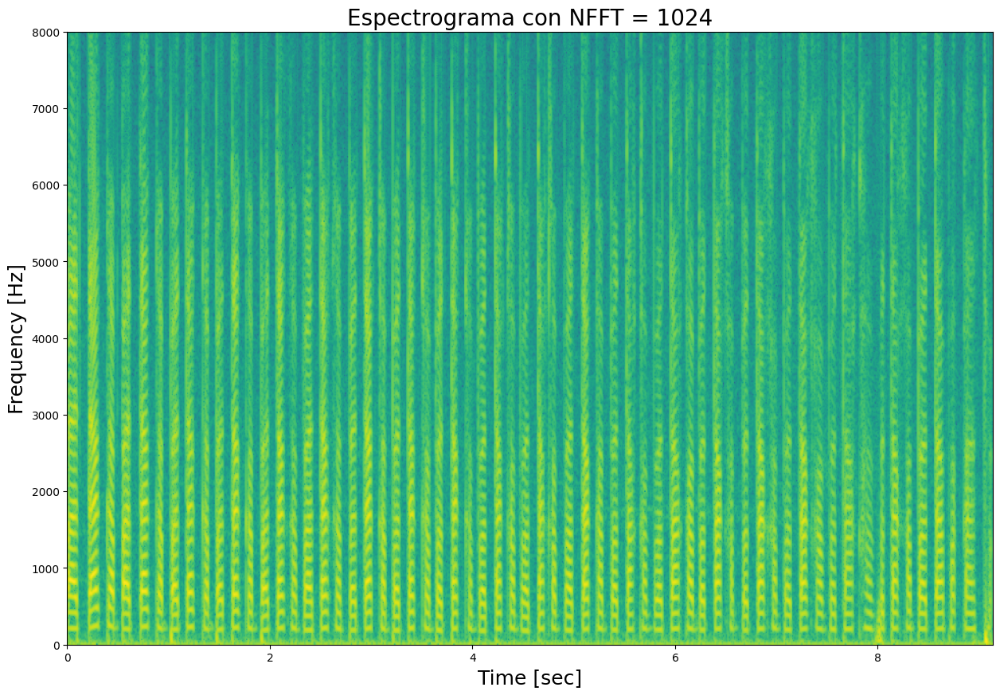

In [11]:
# NFFT = 1024

espectro, nfft = potspec(apply, 640, 1024) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(15, 10))
plt.title('Espectrograma con NFFT = 1024', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

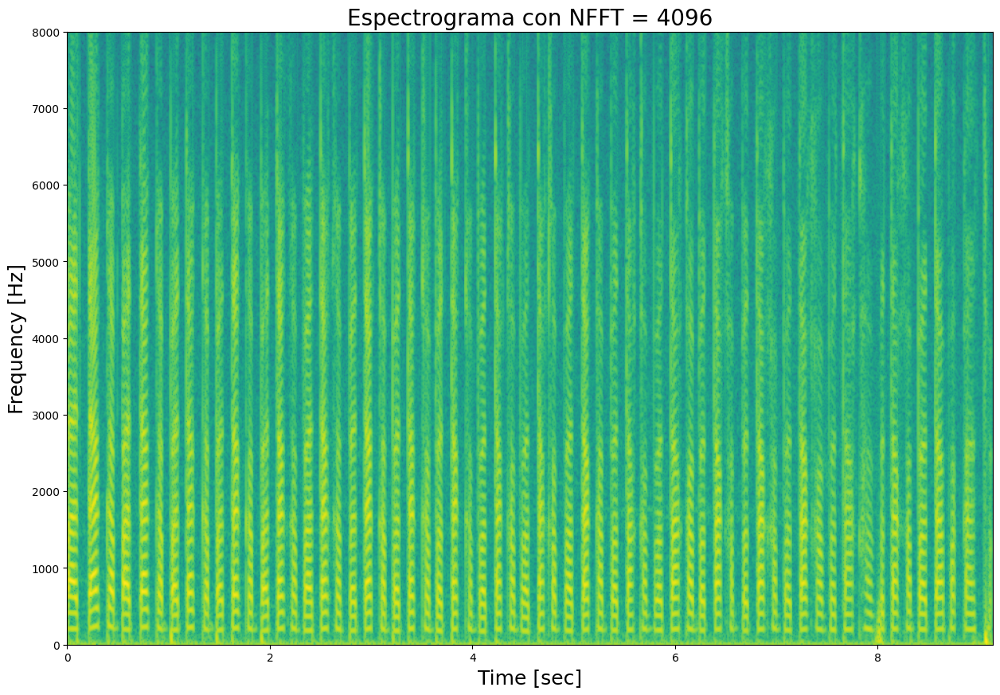

In [ ]:
# NFFT = 4096

espectro, nfft = potspec(apply, 640, 4096) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(15, 10))
plt.title('Espectrograma con NFFT = 4096', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

¿Qué diferencia encuentra al variar este tamaño?

Un valor más grande para la NFFT da una resolución  mayor en frecuencia, por lo que se distinguen mejor dentro de las líneas claras, algunas zonas oscuras que denotan un patrón.
También se nota una mejor distinción de estas líneas a lo largo del tiempo (mejor resolución temporal) debido a una cantidad mayor de puntos en la FFT.


¿A su criterio cuál es el tamaño de NFFT que tiene una mejor resolución tiempo-frecuencia?

Los espectros con NFFT = 1024 y 4096 presentan muchas similitudes en su calidad y definición, pero a mayores frecuencias, se denotan más detalles para NFFT = 4096.

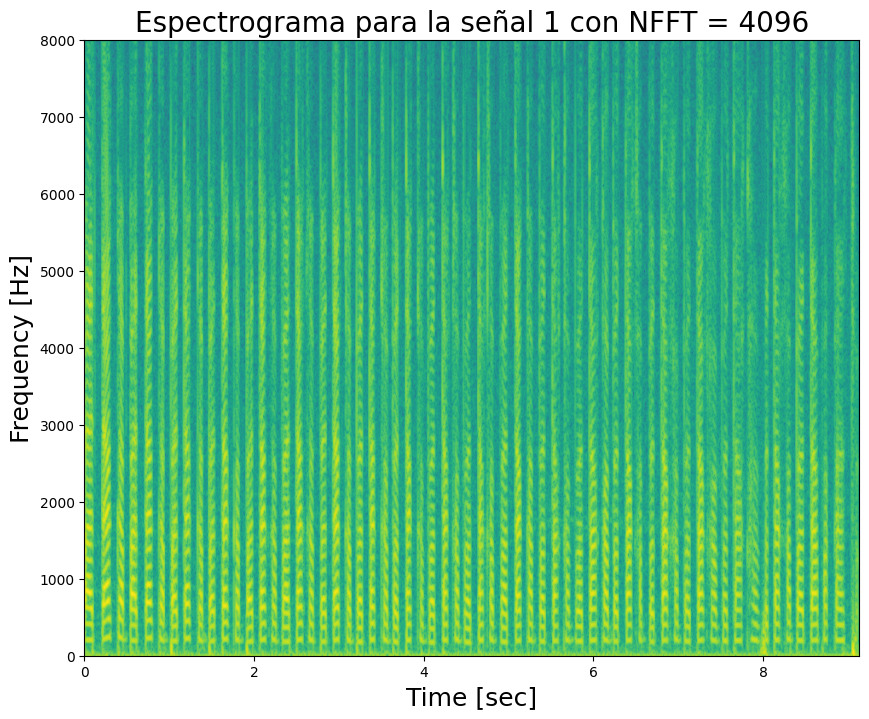

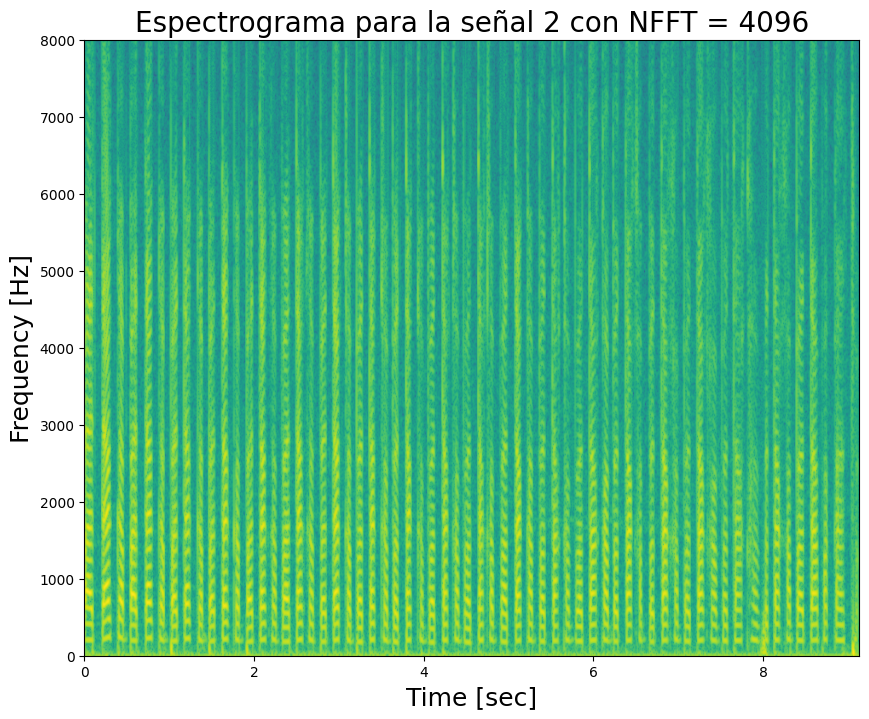

In [12]:
'''
5. Con la mejor resolución del numeral anterior, grafique las dos señales.
¿Qué se puede concluir?
'''


# Se toma la señal 1
vent1 = extraer_ventanas(sig1, int(0.04 * fs), fs)
vent1.shape # (filas, columnas)
ham1 = np.hamming(int(0.04 * fs)) # Construyo la ventana con un tamaño de 40ms x fs
apply1 =  np.array([ventana* ham for ventana in vent])
apply1.shape


espectro1, nfft = potspec(apply1 , 640, 4096) # Calcula la PSD de cada ventana de la matriz
espectro1 = np.flipud(10*np.log10(espectro1).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(10, 8))
plt.title('Espectrograma para la señal 1 con NFFT = 4096', fontsize = 20)
plt.imshow(espectro1, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()


espectro, nfft = potspec(apply, 640, 4096) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica

# Gráfica
plt.figure(figsize=(10, 8))
plt.title('Espectrograma para la señal 2 con NFFT = 4096', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

La principal diferencia entre espectrogramas es el contenido de las señales originales, la señal 1 pertenece a un audio de una voz masculina, que naturalmente es más grave y esto en el espectro representa frecuencias más bajas. Caso contrario a la señal 2, que corresponde a un audio de una voz femenina, con frecuencias más altas debido a una voz más aguda.

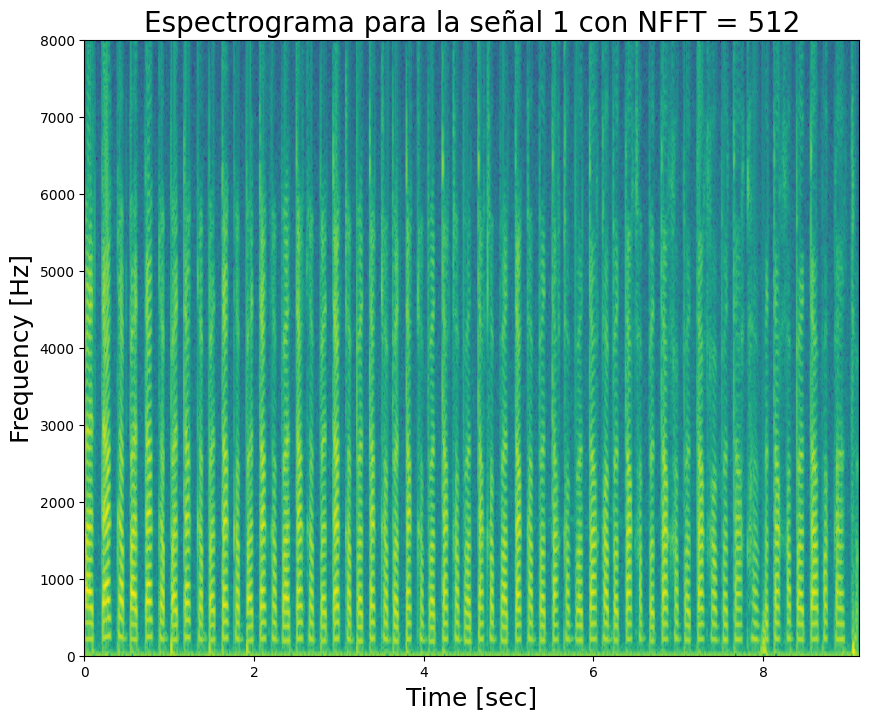

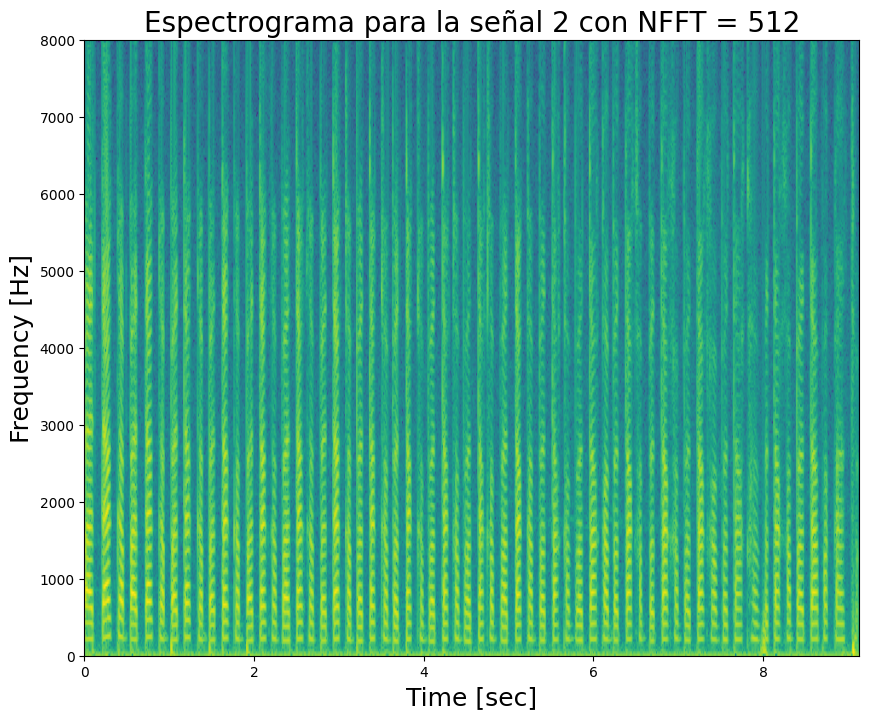

In [14]:
'''
6. Grafique el espectrograma de ambas señales a una NFFT de 512.
¿Qué puede concluir?
¿En qupe se diferencian?
'''

# Se toma la señal 1
vent1 = extraer_ventanas(sig1, int(0.04 * fs), fs)
vent1.shape # (filas, columnas)
ham1 = np.hamming(int(0.04 * fs)) # Construyo la ventana con un tamaño de 40ms x fs
apply1 =  np.array([ventana* ham for ventana in vent])
apply1.shape


espectro1, nfft = potspec(apply1, 640, 512) # Calcula la PSD de cada ventana de la matriz
espectro1 = np.flipud(10*np.log10(espectro1).T) # Se invierte el espectro y se pone en escala logarítmica


# Gráfica
plt.figure(figsize=(10, 8))
plt.title('Espectrograma para la señal 1 con NFFT = 512', fontsize = 20)
plt.imshow(espectro1, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()


espectro, nfft = potspec(apply, 640, 512) # Calcula la PSD de cada ventana de la matriz
espectro = np.flipud(10*np.log10(espectro).T) # Se invierte el espectro y se pone en escala logarítmica

# Gráfica
plt.figure(figsize=(10, 8))
plt.title('Espectrograma para la señal 2 con NFFT = 512', fontsize = 20)
plt.imshow(espectro, aspect ='auto', extent = [0, len(x)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize = 18)
plt.xlabel('Time [sec]', fontsize = 18)
plt.show()

Al igual que el espectrograma con NFFT =  4096, se visualizan las diferencias que aunque pequeñas, están, de las dos voces, tanto masculina como femenina para bajas y altas frecuencias respectivamente.

La diferencia notable con el espectrograma con NFFT = 4096 es una apreciación menos detallada de la acumulación de energía, pues al tener menos puntos (512) habrá menos resolución.

# 2. Conclusiones



- Tener en cuenta cuánta resolución quiero para un espectrograma y también conocer la capacidad computacional con la que cuento son los valores que determinan el tamaño del número de puntos de la NFFT, pues entre más grande sea su valor, tendrá más resolución en frecuencia y se podrán apreciar mejor las acumulaciones de energía pero también requerirá mayor complejidad computacional.

- Para el análisis de señales, sean audios o señales con otro origen físico, los espectrogramas son una gran herramienta al permitir analizar la frecuencia a lo largo del tiempo, pues puede implementarse para la detección de patrones o algún otro tipo de periodicidad en la frecuencia.

- La aplicación de la ventana de Hamming es indispensable para suavizar las discontinuidades que puedan surgir en los bordes de la señal al dividirla en segmentos o ventanas. Estas discontinuidades, si no se tratan adecuadamente, pueden introducir elementos no deseados durante la realización de la transformada de Fourier, comprometiendo la integridad y precisión del análisis.
